In [1]:
from torchvision.datasets import ImageFolder 
import torchvision.transforms as transforms 
import random
from torch.utils.data import DataLoader
import torch
import torch.nn.functional as F
import torchvision.models as models
import torch.nn as nn
from torchvision.datasets import ImageFolder
from torchvision import transforms
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
import os

data_dir = '/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)'

train_dir = data_dir + '/train'
test_dir = data_dir + '/valid'
data_names = os.listdir(train_dir)

In [3]:
#printing diseasetypes
print(data_names)

['Tomato___Late_blight', 'Tomato___healthy', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Potato___healthy', 'Corn_(maize)___Northern_Leaf_Blight', 'Tomato___Early_blight', 'Tomato___Septoria_leaf_spot', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Strawberry___Leaf_scorch', 'Peach___healthy', 'Apple___Apple_scab', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Bacterial_spot', 'Apple___Black_rot', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Peach___Bacterial_spot', 'Apple___Cedar_apple_rust', 'Tomato___Target_Spot', 'Pepper,_bell___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Potato___Late_blight', 'Tomato___Tomato_mosaic_virus', 'Strawberry___healthy', 'Apple___healthy', 'Grape___Black_rot', 'Potato___Early_blight', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Common_rust_', 'Grape___Esca_(Black_Measles)', 'Raspberry___healthy', 'Tomato___Leaf_Mold', 'Tomato__

In [4]:
plants = []
NumberOfDiseases = 0
for plant in data_names:
    if plant.split('___')[0] not in plants:
        plants.append(plant.split('___')[0])
    if plant.split('___')[1] != 'healthy':
        NumberOfDiseases += 1

In [5]:
# unique plants in the dataset
print(f"Unique Plants are: \n{plants}")

Unique Plants are: 
['Tomato', 'Grape', 'Orange', 'Soybean', 'Squash', 'Potato', 'Corn_(maize)', 'Strawberry', 'Peach', 'Apple', 'Blueberry', 'Cherry_(including_sour)', 'Pepper,_bell', 'Raspberry']


In [6]:
# number of unique diseases
print("Number of diseases: {}".format(NumberOfDiseases))

Number of diseases: 26


In [7]:
# Number of images for each disease
nums = {}
for disease in data_names:
    nums[disease] = len(os.listdir(train_dir + '/' + disease))
    
# converting the nums dictionary to pandas dataframe passing index as plant name and number of images as column

img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["no. of images"])
img_per_class

,no. of images
Tomato___Late_blight,1851
Tomato___healthy,1926
Grape___healthy,1692
Orange___Haunglongbing_(Citrus_greening),2010
Soybean___healthy,2022
Squash___Powdery_mildew,1736
Potato___healthy,1824
Corn_(maize)___Northern_Leaf_Blight,1908
Tomato___Early_blight,1920
Tomato___Septoria_leaf_spot,1745


Text(0.5, 1.0, 'Images per each class of plant disease')

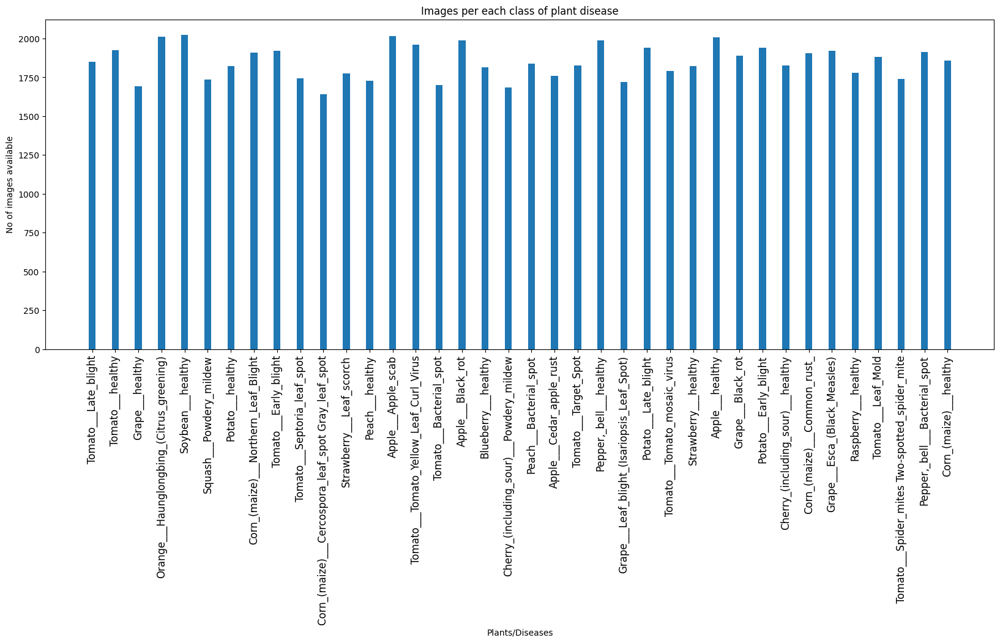

In [8]:
# plotting number of images available for each disease
index = [n for n in range(38)]
plt.figure(figsize=(20, 7))
plt.bar(index, [n for n in nums.values()], width=0.3)
plt.xlabel('Plants/Diseases', fontsize=10)
plt.ylabel('No of images available', fontsize=10)
plt.xticks(index, data_names, fontsize=12, rotation=90)
plt.title('Images per each class of plant disease')

In [9]:
n_train = 0
for value in nums.values():
    n_train += value
print(f"There are {n_train} images for training")

There are 70295 images for training


In [10]:
'''
# datasets for validation and training
train = ImageFolder(train_dir, transform=transforms.ToTensor())
valid = ImageFolder(valid_dir, transform=transforms.ToTensor()) '''

'\n# datasets for validation and training\ntrain = ImageFolder(train_dir, transform=transforms.ToTensor())\nvalid = ImageFolder(valid_dir, transform=transforms.ToTensor()) '

In [11]:
'''img, label = train[0]
print(img.shape, label)'''

'img, label = train[0]\nprint(img.shape, label)'

In [12]:
'''
#Printing random image
random_img, random_label = train[random.randint(0,len(train)-1)]
plt.imshow(random_img.permute(1,2,0))
plt.axis('off')
plt.title(f'label: {train.classes[random_label]}')
plt.show()'''

"\n#Printing random image\nrandom_img, random_label = train[random.randint(0,len(train)-1)]\nplt.imshow(random_img.permute(1,2,0))\nplt.axis('off')\nplt.title(f'label: {train.classes[random_label]}')\nplt.show()"

In [3]:
import tensorflow as tf
size = 224


train_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
    validation_split=0.1,
).flow_from_directory(train_dir,
                      batch_size=16,
                      target_size=(size,size),
                      subset="training",
                      color_mode='rgb',
                      class_mode='categorical',
                      shuffle=True)

Found 63282 images belonging to 38 classes.


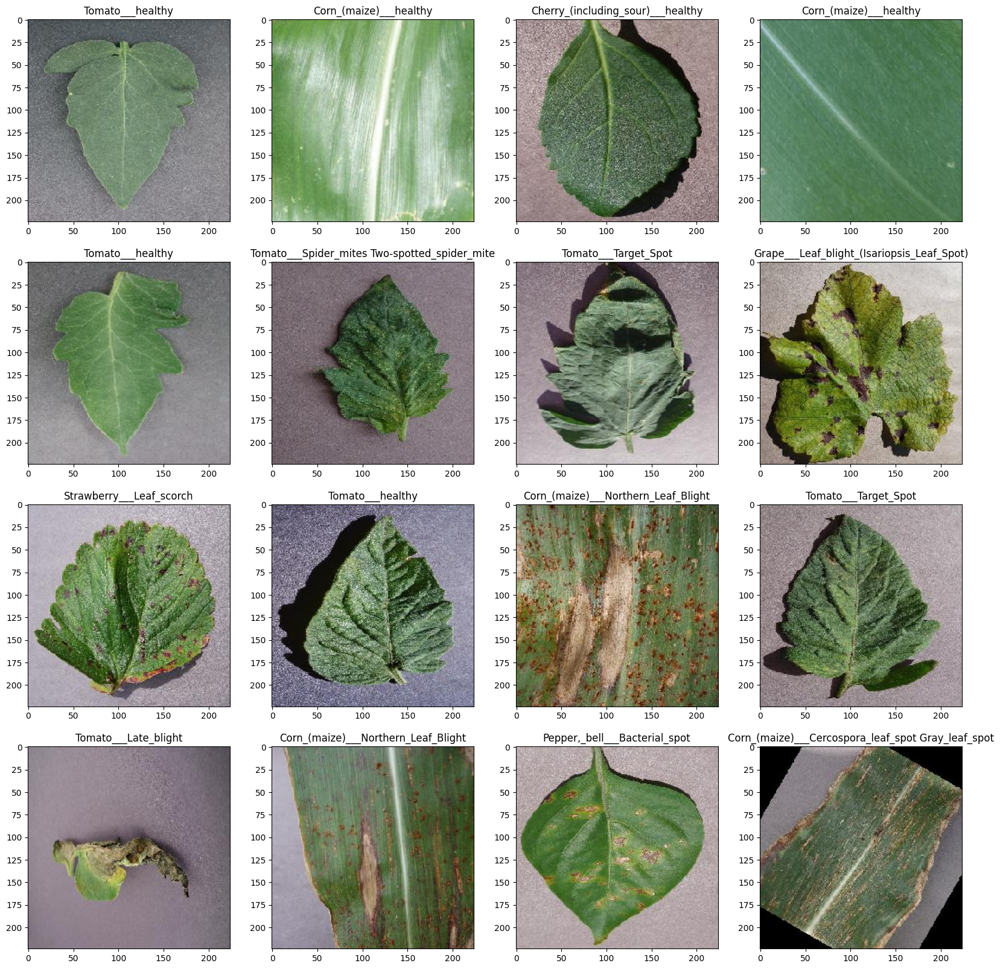

In [4]:
import numpy as np

classes=list(train_generator.class_indices.keys())
plt.figure(figsize=(20,20))
for X_batch, y_batch in train_generator:
    for i in range(0,16):
        plt.subplot(4,4,i+1)
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i]==1)[0][0]])
    plt.show()
    break

In [4]:
valid_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
    validation_split=0.1,
).flow_from_directory(train_dir,
                      batch_size=16,
                      target_size=(size,size),
                      subset='validation',
                      color_mode='rgb',
                      class_mode='categorical',
                      shuffle=False)

Found 7013 images belonging to 38 classes.


In [5]:
test_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
).flow_from_directory(test_dir,
                      batch_size=16,
                      target_size=(size,size),
                      color_mode='rgb',
                      class_mode='categorical',
                      shuffle=False)

Found 17572 images belonging to 38 classes.


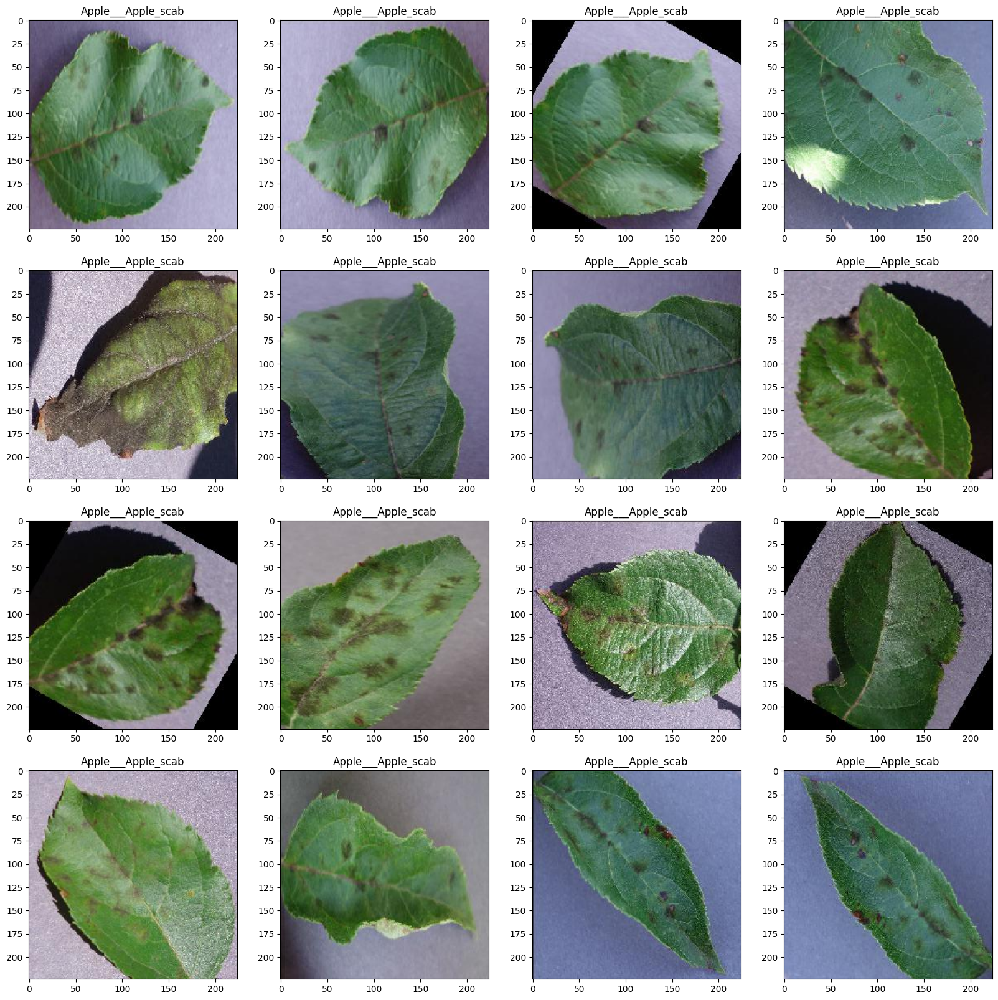

In [8]:
classes=list(train_generator.class_indices.keys())
plt.figure(figsize=(20,20))
for X_batch, y_batch in test_generator:
    for i in range(0,16):
        plt.subplot(4,4,i+1)
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i]==1)[0][0]])
    plt.show()
    break

In [6]:
def Evaluate_model(model, train_generator, valid_generator, test_generator):
    model_evaluate_train = model.evaluate(train_generator)
    print("Loss of Train       : ",model_evaluate_train[0])
    print("Accuracy of Train   : ",model_evaluate_train[1])
    print("Precision of Train  : ",model_evaluate_train[2])
    print("Recall of Train     : ",model_evaluate_train[3])
    
    model_evaluate_valid = model.evaluate(valid_generator)
    print("Loss of Validation      : ",model_evaluate_valid[0])
    print("Accuracy of Validation  : ",model_evaluate_valid[1])
    print("Precision of Validation : ",model_evaluate_valid[2])
    print("Recall of Validation    : ",model_evaluate_valid[3])
    
    model_evaluate_test = model.evaluate(test_generator)
    print("Loss of Test      : ",model_evaluate_test[0])
    print("Accuracy of Test  : ",model_evaluate_test[1])
    print("Precision of Test : ",model_evaluate_test[2])
    print("Recall of Test    : ",model_evaluate_test[3])
        
    return np.round(model_evaluate_train[0], 2), np.round(model_evaluate_valid[0], 2), np.round(model_evaluate_test[0], 2), \
           np.round(model_evaluate_train[1], 2), np.round(model_evaluate_valid[1], 2), np.round(model_evaluate_test[1], 2), \
           np.round(model_evaluate_train[2], 2), np.round(model_evaluate_valid[2], 2), np.round(model_evaluate_test[2], 2), \
           np.round(model_evaluate_train[3], 2), np.round(model_evaluate_valid[3], 2), np.round(model_evaluate_test[3], 2)

In [7]:
def draw_plots(model):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    precision = history.history['precision']
    val_precision = history.history['val_precision']

    recall =history.history['recall']
    val_recall =history.history['val_recall']

    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)
    
    fig, ax = plt.subplots(2, 2, figsize=(17, 12))
    step = 2
        # Accuracy
    ax[0][0].plot(epochs, acc, color='green', label='Training Accuracy')
    ax[0][0].plot(epochs, val_acc, color='blue', label='Validation Accuracy')
    ax[0][0].set_title('Training and Validation Accuracy')
    ax[0][0].set_ylabel('Accuracy')
    ax[0][0].set_xlabel('Epoch')
    ax[0][0].legend()
    ax[0][0].set_xticks(np.arange(0, len(epochs) + step, step))
    ax[0][0].set_ylim(0, 1.02)
    
    # Precision
    ax[0][1].plot(epochs, precision, color='green', label='Training precision')
    ax[0][1].plot(epochs, val_precision, color='red', label='Validation precision')
    ax[0][1].set_title('Training and Validation precision')
    ax[0][1].set_xlabel('Epoch')
    ax[0][1].set_ylabel('precision')
    ax[0][1].legend()
    ax[0][1].set_xticks(np.arange(0, len(epochs) + step, step))
    ax[0][1].set_ylim(0,1.02)
       
    # Recall
    ax[1][0].plot(epochs, recall, color='green', label='Training Recall')
    ax[1][0].plot(epochs, val_recall, color='red', label='Validation Recall')
    ax[1][0].set_title('Training and Validation Recall')
    ax[1][0].set_xlabel('Epoch')
    ax[1][0].set_ylabel('Recall')
    ax[1][0].legend()
    ax[1][0].set_xticks(np.arange(0, len(epochs) + step, step))
    ax[1][0].set_ylim(0,1.02)
    
    # Loss
    ax[1][1].plot(epochs, loss, color='green', label='Training Loss')
    ax[1][1].plot(epochs, val_loss, color='red', label='Validation Loss')
    ax[1][1].set_title('Training and Validation Loss')
    ax[1][1].set_xlabel('Epoch')
    ax[1][1].set_ylabel('Loss')
    ax[1][1].legend()
    ax[1][1].set_xticks(np.arange(0, len(epochs) + step, step))
    
    plt.show()

In [9]:
def Pridect_images (model, pred_dir, class_names):
    a=0
    for img in os.listdir(pred_dir):
        path = os.path.join(pred_dir, img)
        H,W,C = 224,224,3
        img = cv2.imread(path)
        img = cv2.resize(img, (H, W)) 
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
        img = np.array(img)
        img = img.astype("float32")  
        img = img / 255.0
        plt.imshow(img)
        img = np.expand_dims(img, axis=0)
        prediction = np.argmax(model.predict(img),axis=-1)[0]
        plt.title(f"predict : {class_names[prediction]}")
        plt.show()
        a+=1
        if a==5:
            break

In [10]:
strategy = tf.distribute.MirroredStrategy()

In [22]:
with strategy.scope():
    input_shape = (224, 224, 3)
    
    inputs = tf.keras.Input(shape=input_shape)
    
    base_model = tf.keras.applications.VGG19(include_top=False, weights='imagenet', input_tensor=inputs)
    
    base_model.trainable = False
    
    x = tf.keras.layers.Flatten()(base_model.output)
    x = tf.keras.layers.Dense(512, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    x = tf.keras.layers.Dense(256, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dropout(0.4)(x)
    x = tf.keras.layers.Dense(128, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    outputs = tf.keras.layers.Dense(38, activation='softmax')(x)
        
    model_VGG = tf.keras.models.Model(inputs = inputs, outputs = outputs)
    
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999)
    
    model_VGG.compile(optimizer= optimizer, loss="categorical_crossentropy", metrics=["accuracy",'precision','recall'])

model_VGG.summary()

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    12,845,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,04

 Total params: 33,042,662 (126.05 MB)

 Trainable params: 13,016,486 (49.65 MB)

 Non-trainable params: 20,026,176 (76.39 MB)

In [13]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint,ReduceLROnPlateau

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

model_checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)

callbacks=[early_stopping,model_checkpoint]

In [24]:
history = model_VGG.fit(train_generator,
                    epochs = 20,
                    batch_size=32,
                    validation_data = valid_generator,
                    callbacks = callbacks
                    )


Epoch 1/20


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3956/3956 ━━━━━━━━━━━━━━━━━━━━ 335s 83ms/step - accuracy: 0.3904 - loss: 2.3586 - precision: 0.6386 - recall: 0.2256 - val_accuracy: 0.8742 - val_loss: 0.4607 - val_precision: 0.9414 - val_recall: 0.7927
Epoch 2/20
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 257s 65ms/step - accuracy: 0.7549 - loss: 0.8485 - precision: 0.8651 - recall: 0.6403 - val_accuracy: 0.9076 - val_loss: 0.3075 - val_precision: 0.9434 - val_recall: 0.8707
Epoch 3/20
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 256s 65ms/step - accuracy: 0.8217 - loss: 0.6028 - precision: 0.8924 - recall: 0.7505 - val_accuracy: 0.9211 - val_loss: 0.2549 - val_precision: 0.9463 - val_recall: 0.8962
Epoch 4/20
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 256s 65ms/step - accuracy: 0.8555 - loss: 0.4742 - precision: 0.9074 - recall: 0.8069 - val_accuracy: 0.9281 - val_loss: 0.2251 - val_precision: 0.9469 - val_recall: 0.9110
Epoch 5/20
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 257s 65ms/step - accuracy: 0.8780 - loss: 0.4011 - precision: 0.9198 - recall: 0.8368 - val_accuracy: 0.9348 

In [ ]:
def load_latest_checkpoint(model, optimizer, scaler=None):
    """
    Load the latest checkpoint from the model save location, if available.
    """
    checkpoint_files = [f for f in os.listdir(model_save_loc) if f.startswith('checkpoint_epoch_') and f.endswith('.pth')]
    if not checkpoint_files:
        print("No checkpoints found. Starting training from scratch.")
        return 0, None

    # Find the latest checkpoint file by epoch number
    latest_file = max(checkpoint_files, key=lambda x: int(x.split('_')[-1].split('.')[0]))
    checkpoint_path = os.path.join(model_save_loc, latest_file)

    print(f"Loading checkpoint from: {checkpoint_path}")
    checkpoint = torch.load(checkpoint_path) #weights_only=True not needed
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    if scaler and 'scaler' in checkpoint:
        scaler.load_state_dict(checkpoint['scaler'])
    start_epoch = checkpoint['epoch'] + 1  # Resume from the next epoch
    return start_epoch, checkpoint['loss']

In [ ]:
checkpoint_path = os.path.join(model_save_loc, f'checkpoint_epoch_{epoch}.pth')
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scaler': scaler.state_dict(),  # Save the scaler state
            'loss': epoch_loss / len(train_loader.load_dataset()),
        }, checkpoint_path)
        print(f"Checkpoint saved at: {checkpoint_path}")

In [25]:
Report_VGG = []
Report_VGG.append(Evaluate_model(model_VGG, train_generator, valid_generator, test_generator))
Report_VGG

3956/3956 ━━━━━━━━━━━━━━━━━━━━ 218s 55ms/step - accuracy: 0.9961 - loss: 0.0158 - precision: 0.9964 - recall: 0.9959
Loss of Train       :  0.01580619439482689
Accuracy of Train   :  0.9959546327590942
Precision of Train  :  0.9962838888168335
Recall of Train     :  0.9955911636352539
439/439 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - accuracy: 0.9725 - loss: 0.0897 - precision: 0.9745 - recall: 0.9707
Loss of Validation      :  0.1606704294681549
Accuracy of Validation  :  0.9518038034439087
Precision of Validation :  0.9568345546722412
Recall of Validation    :  0.9482389688491821
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 93s 84ms/step - accuracy: 0.9718 - loss: 0.0933 - precision: 0.9743 - recall: 0.9697
Loss of Test      :  0.1457907110452652
Accuracy of Test  :  0.9553266763687134
Precision of Test :  0.9600827097892761
Recall of Test    :  0.9512861371040344


[(0.02, 0.16, 0.15, 1.0, 0.95, 0.96, 1.0, 0.96, 0.96, 1.0, 0.95, 0.95)]

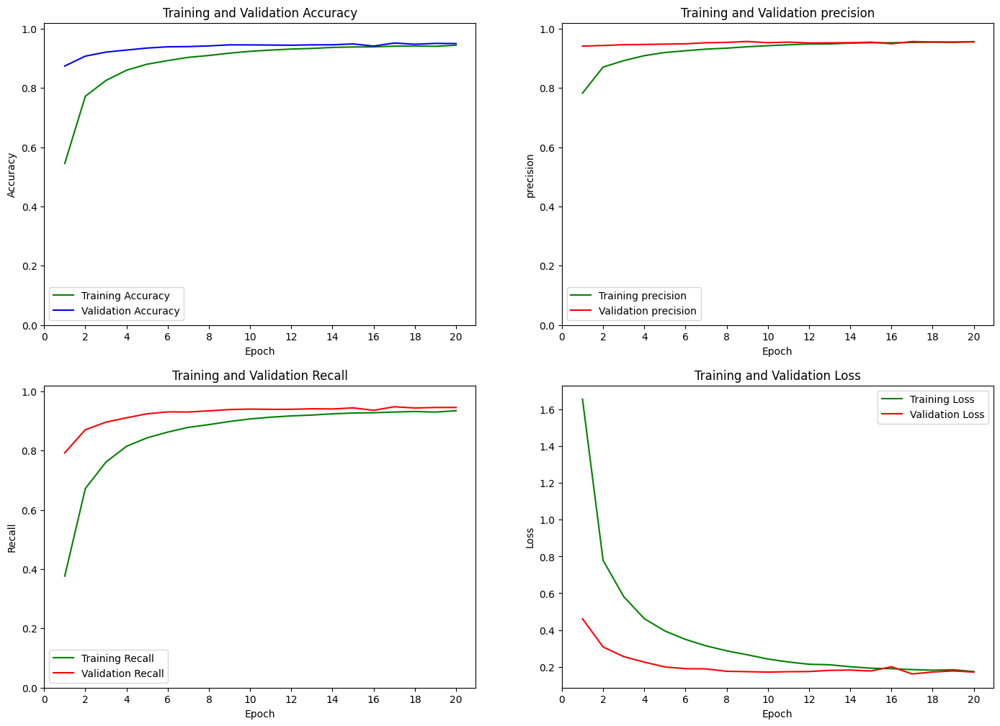

In [26]:
draw_plots(model_VGG)

1099/1099 ━━━━━━━━━━━━━━━━━━━━ 58s 53ms/step
Classification report : 
                                                     precision    recall  f1-score   support

                                Apple___Apple_scab       0.95      0.97      0.96       504
                                 Apple___Black_rot       0.98      0.99      0.99       497
                          Apple___Cedar_apple_rust       0.98      0.99      0.98       440
                                   Apple___healthy       0.99      0.96      0.97       502
                               Blueberry___healthy       0.97      0.99      0.98       454
          Cherry_(including_sour)___Powdery_mildew       1.00      1.00      1.00       421
                 Cherry_(including_sour)___healthy       0.99      0.98      0.99       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.94      0.92      0.93       410
                       Corn_(maize)___Common_rust_       0.99      1.00      0.99       477
        

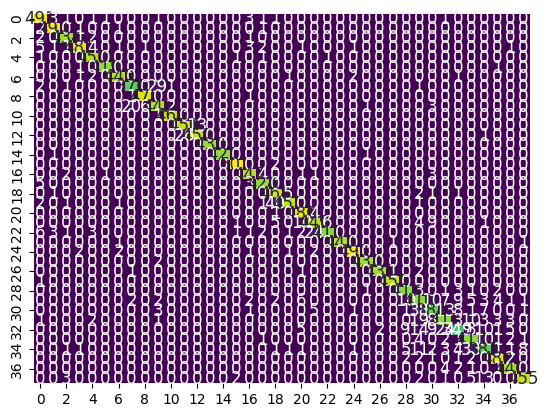

Normalized confusion matrix : 



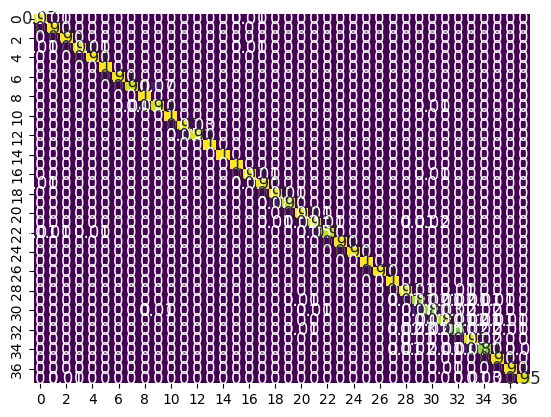

In [27]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

predictions = model_VGG.predict(test_generator)

y_pred = predictions.argmax(axis=-1)

class_names = list(test_generator.class_indices.keys())

print("Classification report : \n",classification_report(test_generator.labels, y_pred, target_names = class_names))

def draw_confusion_matrix(true, preds, normalize=None):
    conf_matx = confusion_matrix(true, preds, normalize = normalize)
    conf_matx = np.round(conf_matx, 2)

    sns.heatmap(conf_matx, annot=True, annot_kws={"size": 12},fmt="g", cbar=False, cmap="viridis")
    plt.show()

print("Confusion matrix : \n")
draw_confusion_matrix(test_generator.labels, y_pred)

print("Normalized confusion matrix : \n")
draw_confusion_matrix(test_generator.labels, y_pred, "true")

In [37]:
model_VGG.save('/kaggle/working/VGG_Plant_Diseases.h5')
#!cp /kaggle/working/VGG_Plant_Diseases.h5 /kaggle/output/ 

In [29]:
print(os.listdir('/kaggle/working'))




['.virtual_documents', 'VGG_Plant_Diseases.h5', 'best_model.keras']


In [35]:
model_VGG_load = tf.keras.models.load_model("/kaggle/input/vgg/tensorflow2/default/1/VGG_Plant_Diseases.h5")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step


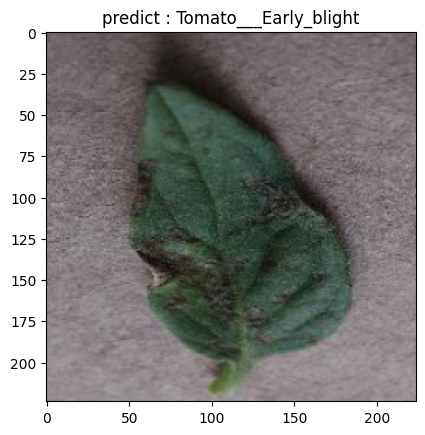

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


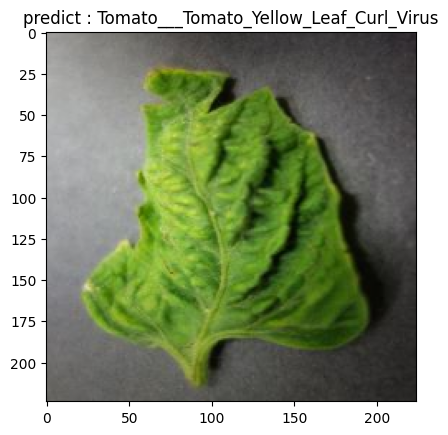

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


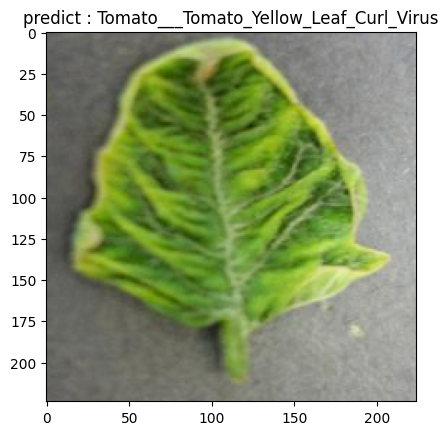

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


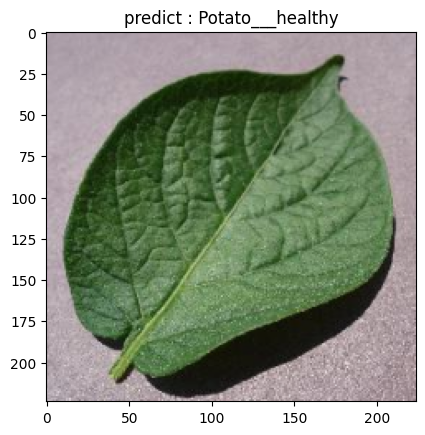

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


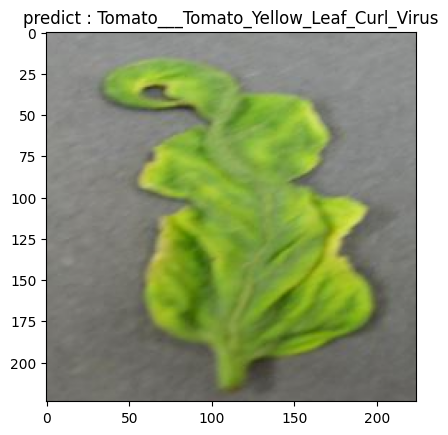

In [36]:
import cv2
pred_dir = '/kaggle/input/new-plant-diseases-dataset/test/test'
class_names = list(test_generator.class_indices.keys())
Pridect_images (model_VGG_load, pred_dir, class_names)

In [14]:
with strategy.scope():
    input_shape = (224, 224, 3)
    
    inputs = tf.keras.Input(shape=input_shape)
    
    # Use ResNet50 
    base_model = tf.keras.applications.ResNet50(include_top=False, weights='imagenet', input_tensor=inputs)
    
    base_model.trainable = False
    
    # Adjusting the following layers to fit the output of ResNet50
    x = tf.keras.layers.Flatten()(base_model.output)
    x = tf.keras.layers.Dense(512, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    x = tf.keras.layers.Dense(256, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dropout(0.4)(x)
    x = tf.keras.layers.Dense(128, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    outputs = tf.keras.layers.Dense(38, activation='softmax')(x)
        
    model_ResNet = tf.keras.models.Model(inputs=inputs, outputs=outputs)
    
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999)
    
    model_ResNet.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy", "precision", "recall"])

model_ResNet.summary()


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 75,141,158 (286.64 MB)

 Trainable params: 51,551,654 (196.65 MB)

 Non-trainable params: 23,589,504 (89.99 MB)

In [15]:
history = model_ResNet.fit(train_generator,
                    epochs = 20,
                    batch_size=32,
                    validation_data = valid_generator,
                    callbacks = callbacks
                    )

Epoch 1/20


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3956/3956 ━━━━━━━━━━━━━━━━━━━━ 448s 110ms/step - accuracy: 0.1547 - loss: 3.4969 - precision: 0.2985 - recall: 0.0460 - val_accuracy: 0.2688 - val_loss: 2.6509 - val_precision: 0.5947 - val_recall: 0.0967
Epoch 2/20
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 270s 68ms/step - accuracy: 0.3744 - loss: 2.1878 - precision: 0.6086 - recall: 0.1825 - val_accuracy: 0.2350 - val_loss: 3.3366 - val_precision: 0.2870 - val_recall: 0.1550
Epoch 3/20
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 266s 67ms/step - accuracy: 0.4809 - loss: 1.7619 - precision: 0.6991 - recall: 0.2914 - val_accuracy: 0.3044 - val_loss: 2.7197 - val_precision: 0.5300 - val_recall: 0.2003
Epoch 4/20
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 271s 68ms/step - accuracy: 0.5442 - loss: 1.5297 - precision: 0.7376 - recall: 0.3672 - val_accuracy: 0.4147 - val_loss: 2.0591 - val_precision: 0.5958 - val_recall: 0.3087
Epoch 5/20
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 270s 68ms/step - accuracy: 0.5841 - loss: 1.3884 - precision: 0.7596 - recall: 0.4249 - val_accuracy: 0.4082

In [16]:
Report_ResNet = []
Report_ResNet.append(Evaluate_model(model_ResNet, train_generator, valid_generator, test_generator))
Report_ResNet

3956/3956 ━━━━━━━━━━━━━━━━━━━━ 178s 45ms/step - accuracy: 0.7212 - loss: 0.9152 - precision: 0.8260 - recall: 0.6386
Loss of Train       :  0.9128233194351196
Accuracy of Train   :  0.7223855257034302
Precision of Train  :  0.8271349668502808
Recall of Train     :  0.6382383704185486
439/439 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - accuracy: 0.7218 - loss: 0.9938 - precision: 0.8179 - recall: 0.6375
Loss of Validation      :  1.0647577047348022
Accuracy of Validation  :  0.6800228357315063
Precision of Validation :  0.7878559231758118
Recall of Validation    :  0.5957507491111755
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 112s 102ms/step - accuracy: 0.7071 - loss: 1.0120 - precision: 0.8153 - recall: 0.6302
Loss of Test      :  1.0642346143722534
Accuracy of Test  :  0.6806851625442505
Precision of Test :  0.7908516526222229
Recall of Test    :  0.5982244610786438


[(0.91, 1.06, 1.06, 0.72, 0.68, 0.68, 0.83, 0.79, 0.79, 0.64, 0.6, 0.6)]

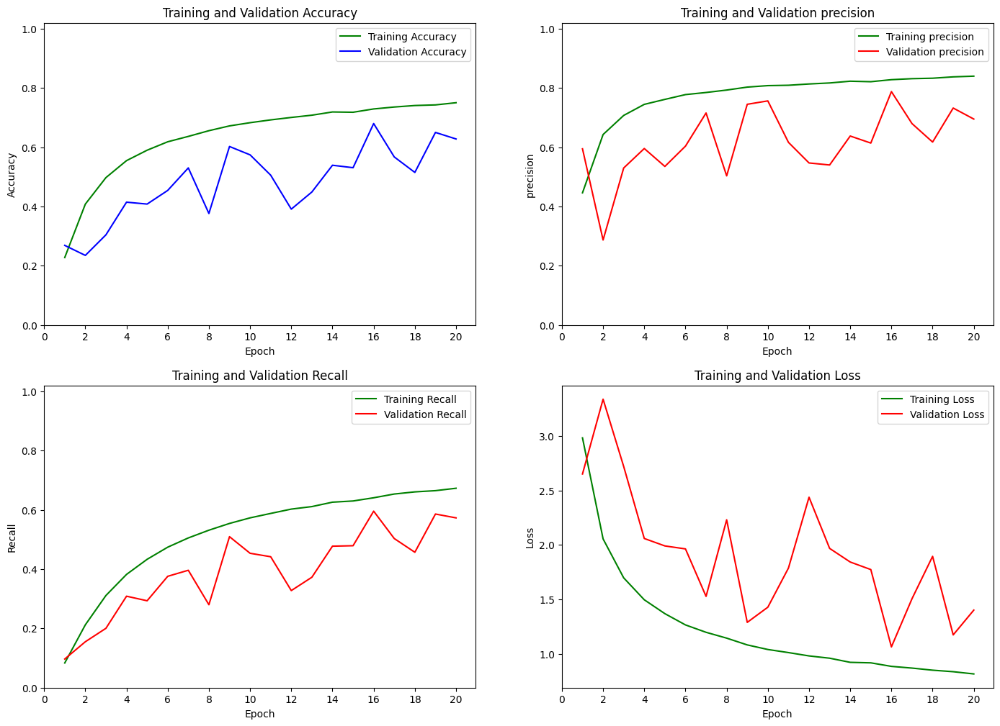

In [17]:
draw_plots(model_ResNet)

In [19]:
from sklearn.metrics import classification_report, confusion_matrix

predictions = model_ResNet.predict(test_generator)

y_pred = predictions.argmax(axis=-1)

class_names = list(test_generator.class_indices.keys())

print("Classification report : \n",classification_report(test_generator.labels, y_pred, target_names = class_names))

def draw_confusion_matrix(true, preds, normalize=None):
    conf_matx = confusion_matrix(true, preds, normalize = normalize)
    conf_matx = np.round(conf_matx, 2)

    sns.heatmap(conf_matx, annot=True, annot_kws={"size": 12},fmt="g", cbar=False, cmap="viridis")
    plt.show()

print("Confusion matrix : \n")
draw_confusion_matrix(test_generator.labels, y_pred)

print("Normalized confusion matrix : \n")
draw_confusion_matrix(test_generator.labels, y_pred, "true")

1099/1099 ━━━━━━━━━━━━━━━━━━━━ 53s 47ms/step
Classification report : 
                                                     precision    recall  f1-score   support

                                Apple___Apple_scab       0.61      0.76      0.68       504
                                 Apple___Black_rot       0.86      0.84      0.85       497
                          Apple___Cedar_apple_rust       0.95      0.16      0.28       440
                                   Apple___healthy       0.79      0.67      0.72       502
                               Blueberry___healthy       0.98      0.12      0.22       454
          Cherry_(including_sour)___Powdery_mildew       0.85      0.76      0.81       421
                 Cherry_(including_sour)___healthy       0.92      0.88      0.90       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.60      0.84      0.70       410
                       Corn_(maize)___Common_rust_       0.97      0.98      0.97       477
        

NameError: name 'sns' is not defined

In [18]:
model_ResNet.save('/kaggle/working/ResNet_Plant_Diseases.h5')

In [ ]:
model_ResNet_load = tf.keras.models.load_model("/kaggle/working/ResNet_Plant_Diseases.h5")

In [ ]:
pred_dir = '/kaggle/input/new-plant-diseases-dataset/test/test'
class_names = list(test_generator.class_indices.keys())
Pridect_images (model_ResNet_load, pred_dir, class_names)

In [18]:
with strategy.scope():
    input_shape = (224, 224, 3)
    inputs = tf.keras.Input(shape=input_shape)
    
    base_model = tf.keras.applications.DenseNet201(include_top=False, weights='imagenet', input_tensor=inputs)
    
    base_model.trainable = False
    
    x = tf.keras.layers.Flatten()(base_model.output)
    x = tf.keras.layers.Dense(512, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dropout(0.4)(x)
    x = tf.keras.layers.Dense(256, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    x = tf.keras.layers.Dense(128, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dropout(0.2)(x)
    outputs = tf.keras.layers.Dense(38, activation='softmax')(x)
        
    model_DenseNet = tf.keras.models.Model(inputs = inputs, outputs = outputs)
    
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
    
    model_DenseNet.compile(optimizer= optimizer, loss="categorical_crossentropy", metrics=["accuracy",'precision','recall'])

model_DenseNet.summary()

74836368/74836368 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 66,664,166 (254.30 MB)

 Trainable params: 48,340,390 (184.40 MB)

 Non-trainable params: 18,323,776 (69.90 MB)

In [20]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint,ReduceLROnPlateau

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

model_ReduceLROnPlateau = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=15, min_lr=0.000001)
model_checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)
callbacks=[early_stopping,model_checkpoint,model_ReduceLROnPlateau]

In [21]:
history = model_DenseNet.fit(train_generator,
                           epochs = 13,
                           batch_size=32,
                           validation_data = valid_generator,
                           callbacks = callbacks
                           )

Epoch 1/20


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3956/3956 ━━━━━━━━━━━━━━━━━━━━ 693s 168ms/step - accuracy: 0.7311 - loss: 0.9493 - precision: 0.8669 - recall: 0.6291 - val_accuracy: 0.9434 - val_loss: 0.1630 - val_precision: 0.9529 - val_recall: 0.9346 - learning_rate: 0.0010
Epoch 2/20
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 424s 107ms/step - accuracy: 0.9178 - loss: 0.2595 - precision: 0.9353 - recall: 0.9024 - val_accuracy: 0.8173 - val_loss: 0.5962 - val_precision: 0.8769 - val_recall: 0.7757 - learning_rate: 0.0010
Epoch 3/20
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 431s 109ms/step - accuracy: 0.9402 - loss: 0.1835 - precision: 0.9520 - recall: 0.9302 - val_accuracy: 0.9671 - val_loss: 0.1131 - val_precision: 0.9697 - val_recall: 0.9634 - learning_rate: 0.0010
Epoch 4/20
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 425s 107ms/step - accuracy: 0.9531 - loss: 0.1409 - precision: 0.9609 - recall: 0.9467 - val_accuracy: 0.9692 - val_loss: 0.1137 - val_precision: 0.9722 - val_recall: 0.9673 - learning_rate: 0.0010
Epoch 5/20
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 424s 107m

KeyboardInterrupt: 

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1099/1099 ━━━━━━━━━━━━━━━━━━━━ 180s 158ms/step
Classification report : 
                                                     precision    recall  f1-score   support

                                Apple___Apple_scab       1.00      0.99      0.99       504
                                 Apple___Black_rot       1.00      1.00      1.00       497
                          Apple___Cedar_apple_rust       0.99      1.00      0.99       440
                                   Apple___healthy       0.99      0.99      0.99       502
                               Blueberry___healthy       0.99      1.00      1.00       454
          Cherry_(including_sour)___Powdery_mildew       0.99      1.00      0.99       421
                 Cherry_(including_sour)___healthy       1.00      0.99      0.99       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.99      0.87      0.92       410
                       Corn_(maize)___Common_rust_       1.00      1.00      1.00       477
      

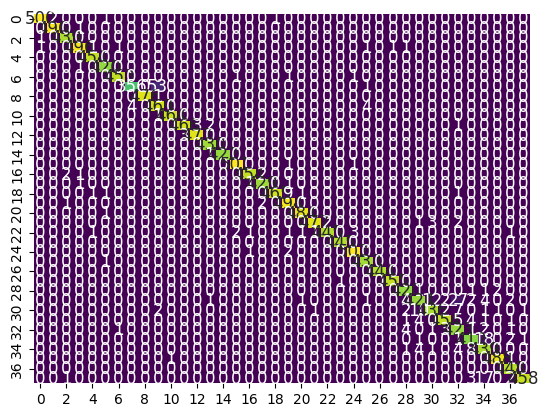

Normalized confusion matrix : 



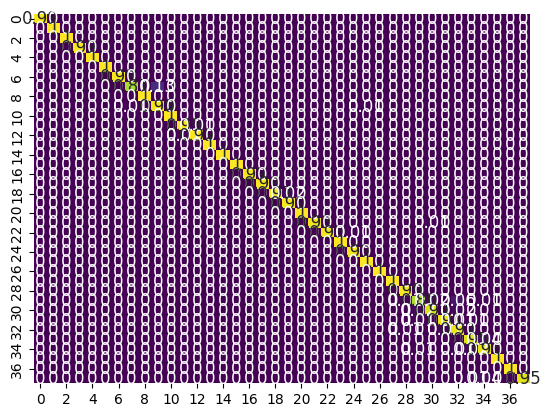

In [23]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
predictions = model_DenseNet.predict(test_generator)

y_pred = predictions.argmax(axis=-1)

class_names = list(test_generator.class_indices.keys())

print("Classification report : \n",classification_report(test_generator.labels, y_pred, target_names = class_names))

def draw_confusion_matrix(true, preds, normalize=None):
    conf_matx = confusion_matrix(true, preds, normalize = normalize)
    conf_matx = np.round(conf_matx, 2)

    sns.heatmap(conf_matx, annot=True, annot_kws={"size": 12},fmt="g", cbar=False, cmap="viridis")
    plt.show()

print("Confusion matrix : \n")
draw_confusion_matrix(test_generator.labels, y_pred)

print("Normalized confusion matrix : \n")
draw_confusion_matrix(test_generator.labels, y_pred, "true")

In [22]:
model_DenseNet.save('/kaggle/working/DenseNet_Plant_Diseases.h5')

In [25]:
Report_DenseNet = []
Report_DenseNet.append(Evaluate_model(model_DenseNet, train_generator, valid_generator, test_generator))
Report_DenseNet

3956/3956 ━━━━━━━━━━━━━━━━━━━━ 334s 84ms/step - accuracy: 0.9987 - loss: 0.0981 - precision: 0.9987 - recall: 0.9987
Loss of Train       :  0.0779326930642128
Accuracy of Train   :  0.9984513521194458
Precision of Train  :  0.9984671473503113
Recall of Train     :  0.9984513521194458
439/439 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - accuracy: 0.9834 - loss: 0.0805 - precision: 0.9837 - recall: 0.9833
Loss of Validation      :  0.11150210350751877
Accuracy of Validation  :  0.973050057888031
Precision of Validation :  0.9740148782730103
Recall of Validation    :  0.9727648496627808
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 93s 85ms/step - accuracy: 0.9874 - loss: 0.0908 - precision: 0.9880 - recall: 0.9864
Loss of Test      :  0.09904476255178452
Accuracy of Test  :  0.9815616011619568
Precision of Test :  0.9822670817375183
Recall of Test    :  0.9803664684295654


[(0.08, 0.11, 0.1, 1.0, 0.97, 0.98, 1.0, 0.97, 0.98, 1.0, 0.97, 0.98)]

In [29]:
draw_plots(model_DenseNet_load)

NameError: name 'history' is not defined

In [28]:
model_DenseNet_load = tf.keras.models.load_model("/kaggle/working/DenseNet_Plant_Diseases.h5")

In [11]:
#Build InceptionV3 model
from tensorflow.keras.applications import InceptionV3
img_height, img_width = 224, 224  
batch_size = 32

base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

for layer in base_model.layers:
    layer.trainable = False

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [16]:
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.models import Model

x = base_model.output
x = GlobalAveragePooling2D()(x)  # Global average pooling layer
x = Dense(512, activation='relu')(x)  # Fully connected layer 
predictions = Dense(len(classes), activation='softmax')(x)  # Final output layer
model = Model(inputs=base_model.input, outputs=predictions)

In [24]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 111, 111,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 111, 111,  │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 111, 111,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 109, 109,  │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 109, 109,  │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 54, 54,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 54, 54,    │      5,120 │ max_pooling2d[0]… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 52, 52,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 52, 52,    │          0 │ batch_normalizat

 Total params: 25,008,532 (95.40 MB)

 Trainable params: 1,068,582 (4.08 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

 Optimizer params: 2,137,166 (8.15 MB)

In [17]:
model.compile(
    loss="categorical_crossentropy",           # Use appropriate loss function for multi-class classification
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),  # Choose optimizer and learning rate
    metrics=["accuracy", "precision", "recall"]  # Metrics to monitor
)

In [25]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

early_stopping=EarlyStopping(monitor='val_loss',patience=8,verbose=1, restore_best_weights=True)
checkpoints=ModelCheckpoint('resnet50.keras', monitor='val_loss', save_best_only=True,verbose=1)
reduceonplateau=ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=0.001)
callback=[early_stopping,reduceonplateau,checkpoints]

In [26]:
history =model.fit(train_generator,
                   epochs=15,
                   validation_data=valid_generator,
                   callbacks=callback,
                   batch_size=128)

Epoch 1/15
3955/3956 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.9217 - loss: 0.2346 - precision: 0.9341 - recall: 0.9116
Epoch 1: val_loss improved from inf to 0.40178, saving model to resnet50.keras
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 130s 33ms/step - accuracy: 0.9217 - loss: 0.2346 - precision: 0.9341 - recall: 0.9116 - val_accuracy: 0.8856 - val_loss: 0.4018 - val_precision: 0.9014 - val_recall: 0.8772 - learning_rate: 0.0010
Epoch 2/15
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.9354 - loss: 0.1880 - precision: 0.9448 - recall: 0.9278
Epoch 2: val_loss improved from 0.40178 to 0.35362, saving model to resnet50.keras
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 133s 34ms/step - accuracy: 0.9354 - loss: 0.1880 - precision: 0.9448 - recall: 0.9278 - val_accuracy: 0.9015 - val_loss: 0.3536 - val_precision: 0.9112 - val_recall: 0.8969 - learning_rate: 0.0010
Epoch 3/15
3955/3956 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.9420 - loss: 0.1657 - precision: 0.9503 - recall: 0.9361
Epoc

In [28]:
model.save('/kaggle/working/InceptionV3_Plant_Diseases.h5')

In [29]:
Report_InceptionV3 = []
Report_InceptionV3.append(Evaluate_model(model, train_generator, valid_generator, test_generator))
Report_InceptionV3

3956/3956 ━━━━━━━━━━━━━━━━━━━━ 120s 30ms/step - accuracy: 0.9650 - loss: 0.0987 - precision: 0.9703 - recall: 0.9612
Loss of Train       :  0.10000820457935333
Accuracy of Train   :  0.9648557305335999
Precision of Train  :  0.9702311754226685
Recall of Train     :  0.961047351360321
439/439 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - accuracy: 0.9286 - loss: 0.2501 - precision: 0.9334 - recall: 0.9245
Loss of Validation      :  0.328139990568161
Accuracy of Validation  :  0.9057464599609375
Precision of Validation :  0.9135283827781677
Recall of Validation    :  0.8993298411369324
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 147s 134ms/step - accuracy: 0.9285 - loss: 0.2361 - precision: 0.9347 - recall: 0.9264
Loss of Test      :  0.29890698194503784
Accuracy of Test  :  0.9100842475891113
Precision of Test :  0.9197388291358948
Recall of Test    :  0.9058160781860352


[(0.1, 0.33, 0.3, 0.96, 0.91, 0.91, 0.97, 0.91, 0.92, 0.96, 0.9, 0.91)]

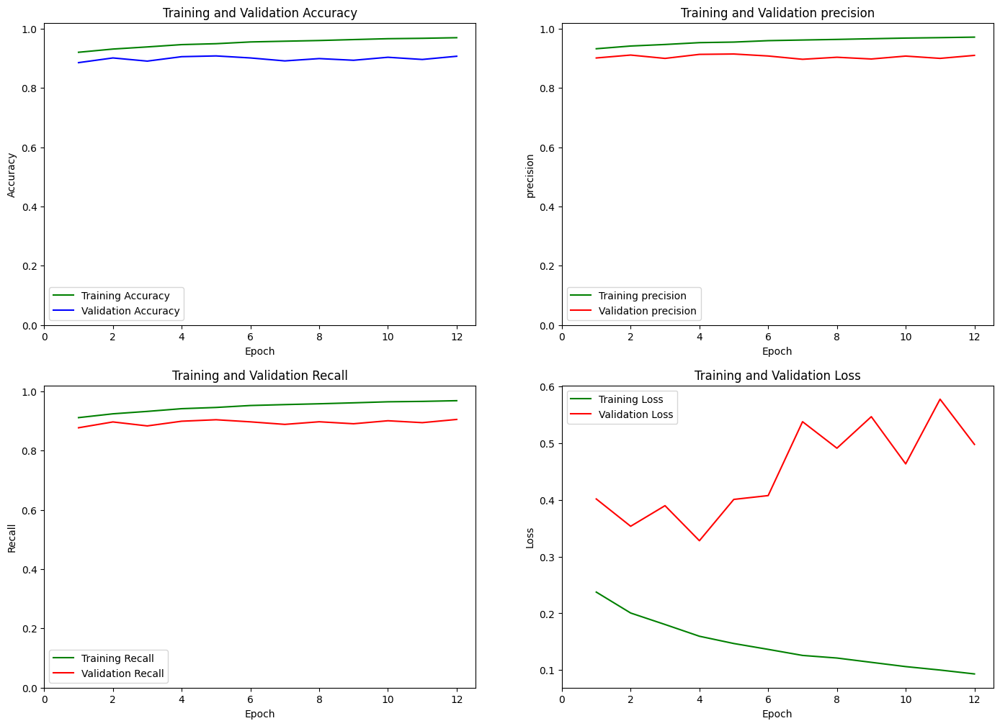

In [30]:
draw_plots(model)

1099/1099 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step
Classification report : 
                                                     precision    recall  f1-score   support

                                Apple___Apple_scab       0.93      0.87      0.90       504
                                 Apple___Black_rot       0.98      0.91      0.95       497
                          Apple___Cedar_apple_rust       0.91      0.96      0.94       440
                                   Apple___healthy       0.90      0.92      0.91       502
                               Blueberry___healthy       0.96      0.96      0.96       454
          Cherry_(including_sour)___Powdery_mildew       0.96      0.97      0.96       421
                 Cherry_(including_sour)___healthy       0.97      0.99      0.98       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.90      0.86      0.88       410
                       Corn_(maize)___Common_rust_       0.97      0.99      0.98       477
        

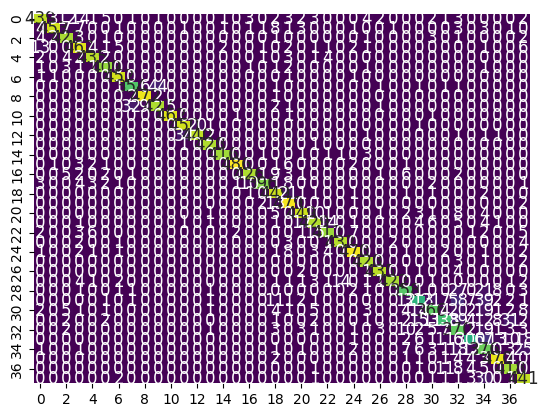

Normalized confusion matrix : 



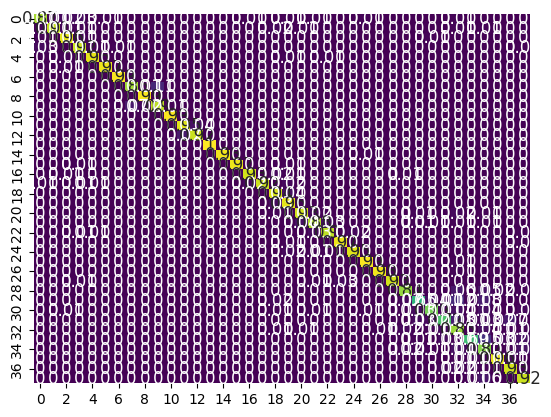

In [31]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
predictions = model.predict(test_generator)

y_pred = predictions.argmax(axis=-1)

class_names = list(test_generator.class_indices.keys())

print("Classification report : \n",classification_report(test_generator.labels, y_pred, target_names = class_names))

def draw_confusion_matrix(true, preds, normalize=None):
    conf_matx = confusion_matrix(true, preds, normalize = normalize)
    conf_matx = np.round(conf_matx, 2)

    sns.heatmap(conf_matx, annot=True, annot_kws={"size": 12},fmt="g", cbar=False, cmap="viridis")
    plt.show()

print("Confusion matrix : \n")
draw_confusion_matrix(test_generator.labels, y_pred)

print("Normalized confusion matrix : \n")
draw_confusion_matrix(test_generator.labels, y_pred, "true")

In [35]:
with strategy.scope():
    input_shape = (224, 224, 3)
    inputs = tf.keras.Input(shape=input_shape)
    
    base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet', input_tensor=inputs)
    
    base_model.trainable = False
    
    x = tf.keras.layers.Flatten()(base_model.output)
    x = tf.keras.layers.Dense(512, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dropout(0.4)(x)
    x = tf.keras.layers.Dense(256, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    x = tf.keras.layers.Dense(128, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dropout(0.2)(x)
    outputs = tf.keras.layers.Dense(38, activation='softmax')(x)
        
    model_InceptionV3 = tf.keras.models.Model(inputs = inputs, outputs = outputs)
    
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
    
    model_InceptionV3.compile(optimizer= optimizer, loss="categorical_crossentropy", metrics=["accuracy",'precision','recall'])

model_InceptionV3.summary()

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_282 (Conv2D) │ (None, 111, 111,  │        864 │ input_layer_3[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 111, 111,  │         96 │ conv2d_282[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_282      │ (None, 111, 111,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_283 (Conv2D) │ (None, 109, 109,  │      9,216 │ activation_282[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │         96 │ conv2d_283[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_283      │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_284 (Conv2D) │ (None, 109, 109,  │     18,432 │ activation_283[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │        192 │ conv2d_284[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_284      │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_12    │ (None, 54, 54,    │          0 │ activation_284[0… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_285 (Conv2D) │ (None, 54, 54,    │      5,120 │ max_pooling2d_12… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        240 │ conv2d_285[0][0]  │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_285      │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_286 (Conv2D) │ (None, 52, 52,    │    138,240 │ activation_285[0… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │        576 │ conv2d_286[0][0]  │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_286      │ (None, 52, 52,    │          0 │ batch_normalizat

 Total params: 48,190,406 (183.83 MB)

 Trainable params: 26,385,830 (100.65 MB)

 Non-trainable params: 21,804,576 (83.18 MB)

In [33]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint,ReduceLROnPlateau

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

model_ReduceLROnPlateau = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=15, min_lr=0.000001)
model_checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)
callbacks=[early_stopping,model_checkpoint,model_ReduceLROnPlateau]

In [37]:
history = model_InceptionV3.fit(train_generator,
                           epochs = 15,
                           batch_size=32,
                           validation_data = valid_generator,
                           callbacks = callbacks
                           )

Epoch 1/15
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 227s 56ms/step - accuracy: 0.6098 - loss: 1.3746 - precision: 0.7940 - recall: 0.4771 - val_accuracy: 0.8705 - val_loss: 0.4078 - val_precision: 0.9075 - val_recall: 0.8383 - learning_rate: 0.0010
Epoch 2/15
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 204s 51ms/step - accuracy: 0.8302 - loss: 0.5334 - precision: 0.8835 - recall: 0.7897 - val_accuracy: 0.8955 - val_loss: 0.3269 - val_precision: 0.9204 - val_recall: 0.8777 - learning_rate: 0.0010
Epoch 3/15
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 204s 51ms/step - accuracy: 0.8732 - loss: 0.3978 - precision: 0.9075 - recall: 0.8427 - val_accuracy: 0.9105 - val_loss: 0.2814 - val_precision: 0.9246 - val_recall: 0.8948 - learning_rate: 0.0010
Epoch 4/15
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 199s 50ms/step - accuracy: 0.8959 - loss: 0.3223 - precision: 0.9209 - recall: 0.8742 - val_accuracy: 0.9089 - val_loss: 0.2991 - val_precision: 0.9286 - val_recall: 0.8961 - learning_rate: 0.0010
Epoch 5/15
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 20

In [40]:
model_InceptionV3.save('/kaggle/working/InceptionV3_Plant_Diseases_updated.h5')

In [38]:
Report_of_InceptionV3 = []
Report_of_InceptionV3.append(Evaluate_model(model_InceptionV3, train_generator, valid_generator, test_generator))
Report_of_InceptionV3

3956/3956 ━━━━━━━━━━━━━━━━━━━━ 149s 38ms/step - accuracy: 0.9885 - loss: 0.1096 - precision: 0.9898 - recall: 0.9874
Loss of Train       :  0.10699827969074249
Accuracy of Train   :  0.9890648126602173
Precision of Train  :  0.990557074546814
Recall of Train     :  0.9879586696624756
439/439 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - accuracy: 0.9568 - loss: 0.1697 - precision: 0.9603 - recall: 0.9531
Loss of Validation      :  0.246982142329216
Accuracy of Validation  :  0.9297019839286804
Precision of Validation :  0.9367143511772156
Recall of Validation    :  0.9244260787963867
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 54s 49ms/step - accuracy: 0.9588 - loss: 0.1419 - precision: 0.9628 - recall: 0.9563
Loss of Test      :  0.2204013466835022
Accuracy of Test  :  0.9367744326591492
Precision of Test :  0.9441688656806946
Recall of Test    :  0.9315957427024841


[(0.11, 0.25, 0.22, 0.99, 0.93, 0.94, 0.99, 0.94, 0.94, 0.99, 0.92, 0.93)]

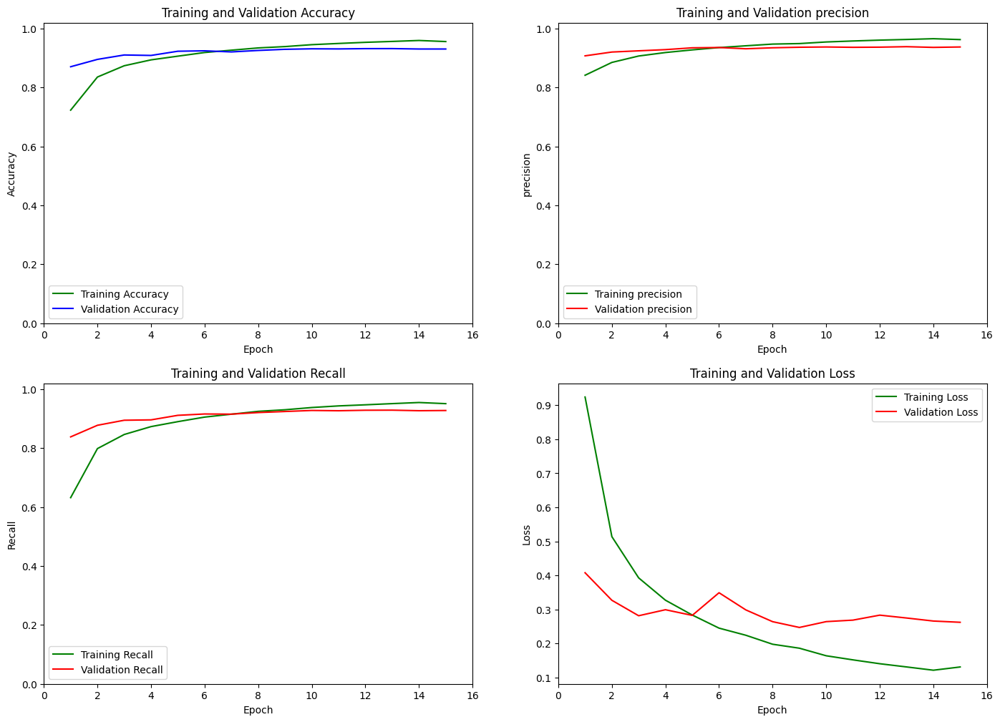

In [39]:
draw_plots(model_InceptionV3)

1099/1099 ━━━━━━━━━━━━━━━━━━━━ 47s 40ms/step
Classification report : 
                                                     precision    recall  f1-score   support

                                Apple___Apple_scab       0.94      0.94      0.94       504
                                 Apple___Black_rot       0.95      0.99      0.97       497
                          Apple___Cedar_apple_rust       0.96      0.99      0.97       440
                                   Apple___healthy       0.95      0.91      0.93       502
                               Blueberry___healthy       0.98      0.98      0.98       454
          Cherry_(including_sour)___Powdery_mildew       1.00      0.98      0.99       421
                 Cherry_(including_sour)___healthy       0.97      0.99      0.98       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.92      0.89      0.90       410
                       Corn_(maize)___Common_rust_       0.98      0.99      0.99       477
        

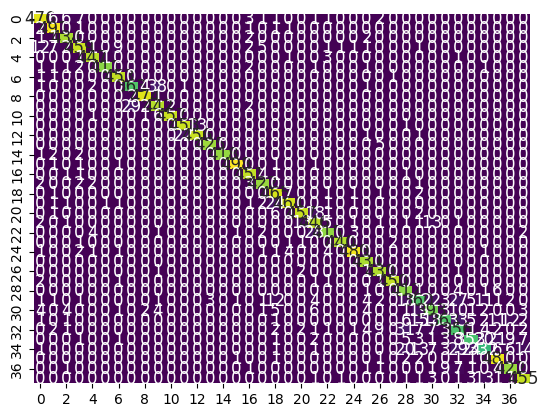

Normalized confusion matrix : 



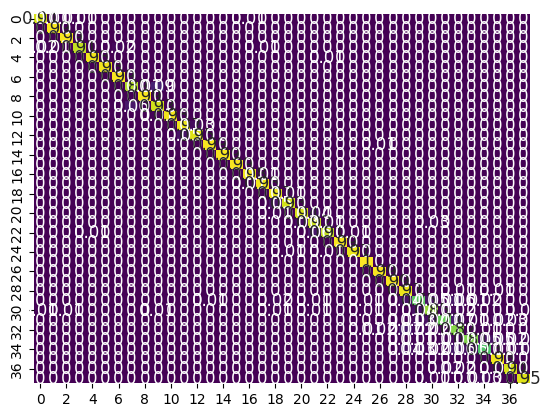

In [41]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
predictions = model_InceptionV3.predict(test_generator)

y_pred = predictions.argmax(axis=-1)

class_names = list(test_generator.class_indices.keys())

print("Classification report : \n",classification_report(test_generator.labels, y_pred, target_names = class_names))

def draw_confusion_matrix(true, preds, normalize=None):
    conf_matx = confusion_matrix(true, preds, normalize = normalize)
    conf_matx = np.round(conf_matx, 2)

    sns.heatmap(conf_matx, annot=True, annot_kws={"size": 12},fmt="g", cbar=False, cmap="viridis")
    plt.show()

print("Confusion matrix : \n")
draw_confusion_matrix(test_generator.labels, y_pred)

print("Normalized confusion matrix : \n")
draw_confusion_matrix(test_generator.labels, y_pred, "true")

In [8]:
'''import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score
from tensorflow.keras.models import load_model

# Step 1: Load the trained models
model_inception = load_model("/kaggle/input/inceptionv3_updated/tensorflow2/default/1/InceptionV3_Plant_Diseases_updated.h5")
model_densenet = load_model("/kaggle/input/inceptionv3/tensorflow2/default/1/DenseNet_Plant_Diseases.h5")
model_vgg = load_model("/kaggle/input/vgg/tensorflow2/default/1/VGG_Plant_Diseases.h5")

# Step 2: Extract predictions from each model as features
def get_predictions(model, generator):
    # Predict probabilities for all images in the generator
    return model.predict(generator)

# Train predictions
train_preds_inception = get_predictions(model_inception, train_generator)
train_preds_densenet = get_predictions(model_densenet, train_generator)
train_preds_vgg = get_predictions(model_vgg, train_generator)

# Validation predictions
val_preds_inception = get_predictions(model_inception, valid_generator)
val_preds_densenet = get_predictions(model_densenet, valid_generator)
val_preds_vgg = get_predictions(model_vgg, valid_generator)

# Test predictions
test_preds_inception = get_predictions(model_inception, test_generator)
test_preds_densenet = get_predictions(model_densenet, test_generator)
test_preds_vgg = get_predictions(model_vgg, test_generator)

# Step 3: Combine predictions as features for stacking
def combine_features(pred1, pred2, pred3):
    return np.hstack([pred1, pred2, pred3])

# Combine for training
train_features = combine_features(train_preds_inception, train_preds_densenet, train_preds_vgg)
val_features = combine_features(val_preds_inception, val_preds_densenet, val_preds_vgg)
test_features = combine_features(test_preds_inception, test_preds_densenet, test_preds_vgg)

# Step 4: Extract true labels from the generator
# Assuming the file names are used to create class indices
train_labels = train_generator.classes
val_labels = valid_generator.classes
test_labels = test_generator.classes

# Step 5: Train Logistic Regression as meta-classifier
meta_classifier = LogisticRegression(max_iter=500)  # Increase max_iter if needed
meta_classifier.fit(train_features, train_labels)

# Step 6: Evaluate on Validation and Test Sets
val_predictions = meta_classifier.predict(val_features)
test_predictions = meta_classifier.predict(test_features)

# Validation metrics
val_accuracy = accuracy_score(val_labels, val_predictions)
val_precision = precision_score(val_labels, val_predictions, average="weighted")
val_recall = recall_score(val_labels, val_predictions, average="weighted")

print(f"Validation Accuracy: {val_accuracy}")
print(f"Validation Precision: {val_precision}")
print(f"Validation Recall: {val_recall}")

# Test metrics
test_accuracy = accuracy_score(test_labels, test_predictions)
test_precision = precision_score(test_labels, test_predictions, average="weighted")
test_recall = recall_score(test_labels, test_predictions, average="weighted")

print(f"Test Accuracy: {test_accuracy}")
print(f"Test Precision: {test_precision}")
print(f"Test Recall: {test_recall}")
'''

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1735520039.731483     110 service.cc:145] XLA service 0x7e55a00042e0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1735520039.731536     110 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


   3/3956 ━━━━━━━━━━━━━━━━━━━━ 3:45 57ms/step 

I0000 00:00:1735520045.394783     110 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3956/3956 ━━━━━━━━━━━━━━━━━━━━ 352s 87ms/step
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 203s 47ms/step
3956/3956 ━━━━━━━━━━━━━━━━━━━━ 158s 39ms/step
439/439 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step
439/439 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step
439/439 ━━━━━━━━━━━━━━━━━━━━ 19s 43ms/step
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 106s 97ms/step
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 60s 55ms/step
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 44s 40ms/step
Validation Accuracy: 0.0514758306003137
Validation Precision: 0.05728565813915317
Validation Recall: 0.0514758306003137
Test Accuracy: 0.050762576826769865
Test Precision: 0.05195641285195305
Test Recall: 0.050762576826769865


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [13]:
'''from sklearn.ensemble import RandomForestClassifier

# Update stacking model
meta_model = RandomForestClassifier(n_estimators=100, random_state=42)
meta_model.fit(train_features, train_labels)'''


RandomForestClassifier(random_state=42)

In [14]:
'''# Step 6: Evaluate on Validation and Test Sets
val_predictions = meta_model.predict(val_features)
test_predictions = meta_model.predict(test_features)

# Validation metrics
val_accuracy = accuracy_score(val_labels, val_predictions)
val_precision = precision_score(val_labels, val_predictions, average="weighted")
val_recall = recall_score(val_labels, val_predictions, average="weighted")

print(f"Validation Accuracy: {val_accuracy}")
print(f"Validation Precision: {val_precision}")
print(f"Validation Recall: {val_recall}")

# Test metrics
test_accuracy = accuracy_score(test_labels, test_predictions)
test_precision = precision_score(test_labels, test_predictions, average="weighted")
test_recall = recall_score(test_labels, test_predictions, average="weighted")

print(f"Test Accuracy: {test_accuracy}")
print(f"Test Precision: {test_precision}")
print(f"Test Recall: {test_recall}")'''

Validation Accuracy: 0.029801796663339514
Validation Precision: 0.03324587691771786
Validation Recall: 0.029801796663339514
Test Accuracy: 0.029990894605053494
Test Precision: 0.030946142099405233
Test Recall: 0.029990894605053494


In [15]:
# Get predictions from all three models
y_pred1 = model_inception.predict(test_generator)  # Shape: (num_samples, num_classes)
y_pred2 = model_vgg.predict(test_generator)  # Shape: (num_samples, num_classes)
y_pred3 = model_densenet.predict(test_generator)  # Shape: (num_samples, num_classes)

# Average the probabilities
final_probabilities = (y_pred1 + y_pred2 + y_pred3) / 3

# Get final predictions (class with the highest probability)
final_predictions = final_probabilities.argmax(axis=1)

# Map predictions to class labels
class_labels = list(test_generator.class_indices.keys())
final_classes = [class_labels[pred] for pred in final_predictions]

# Save predictions to evaluate accuracy or other metrics
from sklearn.metrics import accuracy_score, classification_report

# True labels
true_labels = test_generator.classes

# Accuracy and classification report
print("Accuracy:", accuracy_score(true_labels, final_predictions))
print("Classification Report:\n", classification_report(true_labels, final_predictions))


1099/1099 ━━━━━━━━━━━━━━━━━━━━ 47s 43ms/step
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 42s 38ms/step
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 47s 43ms/step
Accuracy: 0.9836671978147052
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99       504
           1       1.00      1.00      1.00       497
           2       1.00      1.00      1.00       440
           3       1.00      0.99      0.99       502
           4       0.99      1.00      1.00       454
           5       1.00      1.00      1.00       421
           6       1.00      1.00      1.00       456
           7       0.97      0.90      0.93       410
           8       1.00      1.00      1.00       477
           9       0.91      0.97      0.94       477
          10       1.00      1.00      1.00       465
          11       0.99      1.00      0.99       472
          12       1.00      0.99      0.99       480
          13       1.00      1.00      1.00       430
 

In [27]:
with open('ensemble_logic.py', 'w') as f:
    model1 = load_model("/kaggle/input/inceptionv3_updated/tensorflow2/default/1/InceptionV3_Plant_Diseases_updated.h5")
    model2 = load_model("/kaggle/input/inceptionv3/tensorflow2/default/1/DenseNet_Plant_Diseases.h5")
    model3 = load_model("/kaggle/input/vgg/tensorflow2/default/1/VGG_Plant_Diseases.h5")
    def ensemble_predict(image):
        class_mapping ={
        0: 'Apple___Apple_scab', 
        1: 'Apple___Black_rot', 
        2: 'Apple___Cedar_apple_rust', 
        3: 'Apple___healthy', 4: 'Blueberry___healthy', 
        5: 'Cherry_(including_sour)___Powdery_mildew', 6: 'Cherry_(including_sour)___healthy', 
        7: 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 8: 'Corn_(maize)___Common_rust_', 
        9: 'Corn_(maize)___Northern_Leaf_Blight', 10: 'Corn_(maize)___healthy', 
        11: 'Grape___Black_rot', 12: 'Grape___Esca_(Black_Measles)', 
        13: 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 14: 'Grape___healthy', 
        15: 'Orange___Haunglongbing_(Citrus_greening)', 16: 'Peach___Bacterial_spot', 
        17: 'Peach___healthy', 18: 'Pepper,_bell___Bacterial_spot', 19: 'Pepper,_bell___healthy', 
        20: 'Potato___Early_blight', 21: 'Potato___Late_blight', 22: 'Potato___healthy', 
        23: 'Raspberry___healthy', 24: 'Soybean___healthy', 25: 'Squash___Powdery_mildew', 
        26: 'Strawberry___Leaf_scorch', 27: 'Strawberry___healthy', 28: 'Tomato___Bacterial_spot', 
        29: 'Tomato___Early_blight', 30: 'Tomato___Late_blight', 31: 'Tomato___Leaf_Mold', 
        32: 'Tomato___Septoria_leaf_spot', 33: 'Tomato___Spider_mites Two-spotted_spider_mite', 
        34: 'Tomato___Target_Spot', 35: 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 
        36: 'Tomato___Tomato_mosaic_virus',
        37: 'Tomato___healthy'
        }
        # Get predictions from each model
        pred1 = model1.predict(image)
        pred2 = model2.predict(image)
        pred3 = model3.predict(image)
    
        # Average the predictions
        final_probabilities = (pred1 + pred2 + pred3) / 3
    
        # Get the predicted class
        final_prediction = np.argmax(final_probabilities, axis=1)
        # Extract the scalar value from the ndarray (which will have a single element)
        predicted_class_index = final_prediction[0]  # Get the scalar value (first element)
        predicted_class_name = class_mapping.get(predicted_class_index, "Unknown Class")
        return predicted_class_name

In [24]:
class_mapping = {v: k for k, v in train_generator.class_indices.items()}

print(class_mapping)

{0: 'Apple___Apple_scab', 1: 'Apple___Black_rot', 2: 'Apple___Cedar_apple_rust', 3: 'Apple___healthy', 4: 'Blueberry___healthy', 5: 'Cherry_(including_sour)___Powdery_mildew', 6: 'Cherry_(including_sour)___healthy', 7: 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 8: 'Corn_(maize)___Common_rust_', 9: 'Corn_(maize)___Northern_Leaf_Blight', 10: 'Corn_(maize)___healthy', 11: 'Grape___Black_rot', 12: 'Grape___Esca_(Black_Measles)', 13: 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 14: 'Grape___healthy', 15: 'Orange___Haunglongbing_(Citrus_greening)', 16: 'Peach___Bacterial_spot', 17: 'Peach___healthy', 18: 'Pepper,_bell___Bacterial_spot', 19: 'Pepper,_bell___healthy', 20: 'Potato___Early_blight', 21: 'Potato___Late_blight', 22: 'Potato___healthy', 23: 'Raspberry___healthy', 24: 'Soybean___healthy', 25: 'Squash___Powdery_mildew', 26: 'Strawberry___Leaf_scorch', 27: 'Strawberry___healthy', 28: 'Tomato___Bacterial_spot', 29: 'Tomato___Early_blight', 30: 'Tomato___Late_blight', 31: 'To

In [31]:
import os
import random
from tensorflow.keras.utils import load_img, img_to_array
import numpy as np

# Define the test directory path
test_dir = '/kaggle/input/new-plant-diseases-dataset/test/'

# Get a random class folder
class_folders = [os.path.join(test_dir, folder) for folder in os.listdir(test_dir)]
random_class_folder = random.choice(class_folders)

# Get a random image from the selected class folder
sample_image_path = os.path.join(random_class_folder, random.choice(os.listdir(random_class_folder)))
print(f"Sample Image Path: {sample_image_path}")

# Load and preprocess the image
def preprocess_image(image_path, target_size=(224, 224)):
    image = load_img(image_path, target_size=target_size)  # Resize image
    image_array = img_to_array(image)  # Convert to array
    image_array = np.expand_dims(image_array, axis=0)  # Add batch dimension
    image_array = image_array / 255.0  # Normalize to [0, 1]
    return image_array

preprocessed_image = preprocess_image(sample_image_path)


Sample Image Path: /kaggle/input/new-plant-diseases-dataset/test/test/PotatoEarlyBlight2.JPG


In [32]:
print(ensemble_predict(preprocessed_image))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Potato___Early_blight


In [10]:
'''

model_evaluate_train = model_inception.evaluate(train_generator)
print("Loss of Train       : ",model_evaluate_train[0])
print("Accuracy of Train   : ",model_evaluate_train[1])
print("Precision of Train  : ",model_evaluate_train[2])
print("Recall of Train     : ",model_evaluate_train[3])'''

3956/3956 ━━━━━━━━━━━━━━━━━━━━ 160s 39ms/step - accuracy: 0.9900 - loss: 0.0944 - precision: 0.9913 - recall: 0.9888
Loss of Train       :  0.10700182616710663
Accuracy of Train   :  0.9890648126602173
Precision of Train  :  0.990541398525238
Recall of Train     :  0.9879586696624756


In [ ]:
# Define batch size
batch_size = 32

# Create DataLoaders
train_loader = DataLoader(train, batch_size=batch_size, num_workers=2, shuffle=True)
valid_loader = DataLoader(valid, batch_size=batch_size,num_workers=2, shuffle=False)

In [ ]:
from tensorflow.keras.applications import ResNet50, InceptionV3, VGG16
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense, Concatenate, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Define the number of classes
num_classes = 38
input_shape = (224, 224, 3)

# ResNet50 Base Model
resnet_base = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
for layer in resnet_base.layers:
    layer.trainable = False  # Freeze layers
resnet_out = GlobalAveragePooling2D()(resnet_base.output)

# InceptionV3 Base Model
inception_base = InceptionV3(weights='imagenet', include_top=False, input_shape=input_shape)
for layer in inception_base.layers:
    layer.trainable = False  # Freeze layers
inception_out = GlobalAveragePooling2D()(inception_base.output)

# VGG16 Base Model
vgg_base = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
for layer in vgg_base.layers:
    layer.trainable = False  # Freeze layers
vgg_out = GlobalAveragePooling2D()(vgg_base.output)

In [ ]:
# Combine the outputs from the three models
combined = Concatenate()([resnet_out, inception_out, vgg_out])


In [ ]:
# Fully connected layers after concatenation
x = Dense(512, activation='relu')(combined)  # First fully connected layer
x = Dropout(0.5)(x)  # Add dropout to prevent overfitting
x = Dense(256, activation='relu')(x)  # Second fully connected layer
x = Dropout(0.3)(x)  # Add another dropout layer

# Final classification layer with Softmax
output = Dense(num_classes, activation='softmax')(x)

# Define the ensemble model
ensemble_model = Model(inputs=[resnet_base.input, inception_base.input, vgg_base.input], outputs=output)


In [ ]:
# Compile the model
ensemble_model.compile(optimizer=Adam(learning_rate=0.001),
                       loss='categorical_crossentropy',
                       metrics=['accuracy'])

# Display model summary
ensemble_model.summary()

In [ ]:
from torch.utils.data import random_split

# Define the sizes for validation and test datasets
valid_size = int(0.5 * len(valid))  # 50% for validation
test_size = len(valid) - valid_size  # Remaining 50% for testing

# Split the dataset
valid_images, test_images = random_split(valid, [valid_size, test_size])


In [ ]:
from torch.utils.data import DataLoader

# Hyperparameters
batch_size = 32

# DataLoaders for train, validation, and test sets
train_loader = DataLoader(train, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(valid_images, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_images, batch_size=batch_size, shuffle=False)


In [ ]:
import numpy as np

#Function to convert PyTorch DataLoader to NumPy arrays
def dataloader_to_numpy(dataloader):
    images = []
    labels = []
    for batch in dataloader:
        x, y = batch
        images.append(x.numpy())  # Convert images to numpy
        labels.append(y.numpy())  # Convert labels to numpy
    images = np.concatenate(images)  # Combine all batches
    labels = np.concatenate(labels)
    return images, labels

# Convert DataLoaders to Numpy
train_images, train_labels = dataloader_to_numpy(train_loader)
valid_images, valid_labels = dataloader_to_numpy(valid_loader)
test_images, test_labels = dataloader_to_numpy(test_loader)

In [ ]:
def load_images_from_dir(directory):
    image_paths = []
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):  # Add other extensions if needed
                image_paths.append(os.path.join(root, file))
    return image_paths

# Extract images
train_images = load_images_from_dir(train_dir)
val_images = load_images_from_dir(valid_dir)

# If test images are part of the valid_dir, adjust path accordingly
test_dir = os.path.join(valid_dir, 'test')  # Update if necessary
test_images = load_images_from_dir(test_dir)

# Summary
print(f"Number of training images: {len(train_images)}")
print(f"Number of validation images: {len(val_images)}")
print(f"Number of testing images: {len(test_images)}")


train_images = train_images / 255.0
valid_images = valid_images / 255.0
test_images = test_images / 255.0


In [ ]:
# Fit the ensemble model
history = ensemble_model.fit(
    [train_loader, train_loader, train_loader],  # Inputs for ResNet, Inception, VGG
    train_labels,  # True labels
    validation_data=([val_loader, val_loader, val_loader], val_labels),  # Validation data
    batch_size=32,
    epochs=20
)


In [ ]:
test_loss, test_accuracy = ensemble_model.evaluate(
    [test_images, test_images, test_images], test_labels, batch_size=32
)

print(f"Test Accuracy: {test_accuracy * 100:.2f}%")
